In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import plot_scripts
import analysis_functions as af

In [2]:
metadata = pd.read_csv('data/FLUXNET_Data_Shuttle/FLUXNET_metadata_successful_daily_sites.csv')
metadata.rename(columns={'Site ID': 'Site'}, inplace=True)

# Daily data
df_wue_daily_fluxnet = pd.read_csv('data/FLUXNET_Data_Shuttle/WUE_combined_daily_shuttle.csv')
df_wue_daily_fluxnet['TIMESTAMP'] = pd.to_datetime(df_wue_daily_fluxnet['TIMESTAMP'])
df_wue_daily_fluxnet.rename(columns={'GPP_DT_VUT_50': 'GPP', 'LE_CORR_kg_H2O': 'ET'}, inplace=True)
df_wue_daily_fluxnet.rename(columns={'GPP_DT_VUT_USTAR50': 'GPP', 'LE_CORR_kg_H2O': 'ET'}, inplace=True)
df_wue_daily_fluxnet['ET'] = df_wue_daily_fluxnet['ET'] * 3600 * 24 / 1000  # kg/m2/s -> mm/day

# Half-hourly data
df_wue_hh_fluxnet = pd.read_csv('data/FLUXNET_Data_Shuttle/WUE_combined_halfhourly_shuttle.csv')
df_wue_hh_fluxnet['TIMESTAMP'] = pd.to_datetime(df_wue_hh_fluxnet['Local_Time_30min'], format='%Y-%m-%d %H:%M:%S')
df_wue_hh_fluxnet.rename(columns={'GPP_DT_VUT_50': 'GPP', 'LE_CORR': 'ET'}, inplace=True)
df_wue_hh_fluxnet.rename(columns={'GPP_DT_VUT_USTAR50': 'GPP', 'LE_CORR': 'ET', 'Long': 'Lon'}, inplace=True)

data_folder = 'data/ECOCO3_cleaned/'
date = 'ECOCO3_V2'

os.makedirs('figures/C2_validation/', exist_ok=True)

df_wue_daily_ecoco3 = pd.read_csv(data_folder + date + "_df_wue_daily_fullset.csv")
df_wue_hh_ecoco3 = pd.read_csv(data_folder + date + "_df_wue_fullset.csv")
df_wue_hh_ecoco3['LocalTime'] = pd.to_datetime(df_wue_hh_ecoco3['LocalTime'], format='%Y-%m-%d %H:%M:%S')
df_wue_daily_ecoco3['LocalTime'] = pd.to_datetime(df_wue_daily_ecoco3['LocalTime'], format='%Y-%m-%d %H:%M:%S')

# Keep only rows where IGBP class agrees between MODIS and VIIRS
df_wue_hh_ecoco3 = df_wue_hh_ecoco3[df_wue_hh_ecoco3['IGBP_class_MODIS'] == df_wue_hh_ecoco3['IGBP_class_VIIRS']]
df_wue_daily_ecoco3 = df_wue_daily_ecoco3[df_wue_daily_ecoco3['IGBP_class_MODIS'] == df_wue_daily_ecoco3['IGBP_class_VIIRS']]
df_wue_hh_ecoco3.rename(columns={'IGBP_class_MODIS': 'Veg'}, inplace=True)
df_wue_daily_ecoco3.rename(columns={'IGBP_class_MODIS': 'Veg'}, inplace=True)

df_wue_hh_ecoco3['WUE'] = df_wue_hh_ecoco3['WUE_gCkgH20']
df_wue_daily_ecoco3['WUE'] = df_wue_daily_ecoco3['WUE_gCkgH20']
df_wue_hh_ecoco3 = df_wue_hh_ecoco3[df_wue_hh_ecoco3['ET'] > 50]

df_wue_hh_ecoco3 = df_wue_hh_ecoco3.replace([np.inf, -np.inf], np.nan).dropna()
df_wue_daily_ecoco3 = df_wue_daily_ecoco3.replace([np.inf, -np.inf], np.nan).dropna()

df_wue_hh_ecoco3['TIMESTAMP'] = df_wue_hh_ecoco3['LocalTime']
df_wue_daily_ecoco3['TIMESTAMP'] = df_wue_daily_ecoco3['LocalTime']
df_wue_daily_ecoco3['Site'] = df_wue_daily_ecoco3['SiteName']
df_wue_hh_ecoco3['Site'] = df_wue_hh_ecoco3['SiteName']

df_wue_hh_ecoco3['Hour'] = df_wue_hh_ecoco3['TIMESTAMP'].dt.hour
df_wue_daily_ecoco3['Hour'] = df_wue_daily_ecoco3['TIMESTAMP'].dt.hour

df_wue_hh_fluxnet['Hour'] = df_wue_hh_fluxnet['TIMESTAMP'].dt.hour
df_wue_daily_fluxnet['Hour'] = df_wue_daily_fluxnet['TIMESTAMP'].dt.hour    

In [3]:
# ── Thresholds ───────────────────────────────────────────────────────────────
MIN_SCENES     = 500  # half-hourly observations per category per dataset
MIN_SITE_YEARS = 3    # unique (Site × Year) pairs per category per dataset

eco_veg_stats  = af.category_stats(df_wue_hh_ecoco3,  'Veg')
flux_veg_stats = af.category_stats(df_wue_hh_fluxnet, 'Veg')
eco_kg_stats   = af.category_stats(df_wue_hh_ecoco3,  'kg_label')
flux_kg_stats  = af.category_stats(df_wue_hh_fluxnet, 'kg_label')

valid_veg = af.filter_valid(eco_veg_stats, flux_veg_stats, MIN_SCENES, MIN_SITE_YEARS)
valid_kg  = af.filter_valid(eco_kg_stats,  flux_kg_stats, MIN_SCENES, MIN_SITE_YEARS)

# ── Summary ───────────────────────────────────────────────────────────────────
af.print_summary(eco_veg_stats,  flux_veg_stats, valid_veg, "Vegetation types", MIN_SCENES, MIN_SITE_YEARS)
af.print_summary(eco_kg_stats,   flux_kg_stats,  valid_kg,  "Climate classes", MIN_SCENES, MIN_SITE_YEARS)
print(f"\nvalid_veg ({len(valid_veg)}): {valid_veg}")
print(f"valid_kg  ({len(valid_kg)}):  {valid_kg}")


Vegetation types  (MIN_SCENES=500, MIN_SITE_YEARS=3)
                      ECOCO3                   FLUXNET
              scenes  site-yr     scenes  site-yr   kept
  --------------------------------------------------------------
  BSV          1,245      433     67,303       11   Y
  CRO          4,347     1206   2,521,459      276   Y
  CSH            397      117    286,782       30   -
  CVM          2,446      770    262,184       29   Y
  DBF          1,590      505   1,257,664      143   Y
  DNF             19        8    184,180       20   -
  EBF          1,650      449    991,460      105   Y
  ENF          2,200      555   1,784,637      201   Y
  GRA          4,448     1221   2,655,508      304   Y
  MF           2,798      725    324,651       38   Y
  OSH          1,476      478    657,630       76   Y
  SAV          2,990      852    280,991       34   Y
  SNO            372      101          0        0   -
  URB          4,259     1255          0        0   -
  WAT    

In [4]:
RADIUS_KM = 15.0  # "around the tower" radius for pulling in same-vegetation ECOCO3 pixels

# Build (tower, pixel) matches once from half-hourly data (same locations used for daily)
pixel_matches = af.build_tower_pixel_matches(
    df_wue_hh_fluxnet, df_wue_hh_ecoco3,
    radius_km=RADIUS_KM, lat_col='Lat', lon_col='Lon'
)
n_towers = pixel_matches[['site_lat', 'site_lon']].drop_duplicates().shape[0]
n_pixels = pixel_matches[['Lat', 'Lon']].drop_duplicates().shape[0]
print(f"{n_towers} tower(s) matched to {n_pixels} distinct ECOCO3 pixel location(s) "
      f"(same vegetation, within {RADIUS_KM} km)")

# ── Half-hourly ───────────────────────────────────────────────────────────────
df_coincident = af.make_coincident(
    df_wue_hh_fluxnet, df_wue_hh_ecoco3, pixel_matches,
    tolerance=pd.Timedelta('0.25h')
)

df_coincident['TOD'] = df_coincident['TIMESTAMP'].apply(af.assign_time_of_day)
df_coincident = df_coincident.dropna(subset=['TOD'])
print(f"Coincident half-hourly (±0.25 hr, ≤{RADIUS_KM} km, same veg): {len(df_coincident)}")

# ── Daily ─────────────────────────────────────────────────────────────────────
# Daily FLUXNET has 'Long' instead of 'Lon' — rename for the matcher.
# normalize_dates floors ECO overpass times (~13:30) to midnight so
# merge_asof aligns on calendar day; tolerance='12h' keeps same-day only.
df_flux_daily_in = df_wue_daily_fluxnet.rename(columns={'Long': 'Lon'})

df_coincident_daily = af.make_coincident(
    df_flux_daily_in, df_wue_daily_ecoco3, pixel_matches,
    tolerance=pd.Timedelta('12h'), normalize_dates=True
)
print(f"Coincident daily     (±12 h normalized, ≤{RADIUS_KM} km, same veg): {len(df_coincident_daily)}")

64 tower(s) matched to 70 distinct ECOCO3 pixel location(s) (same vegetation, within 15.0 km)
Coincident half-hourly (±0.25 hr, ≤15.0 km, same veg): 332
Coincident daily     (±12 h normalized, ≤15.0 km, same veg): 375


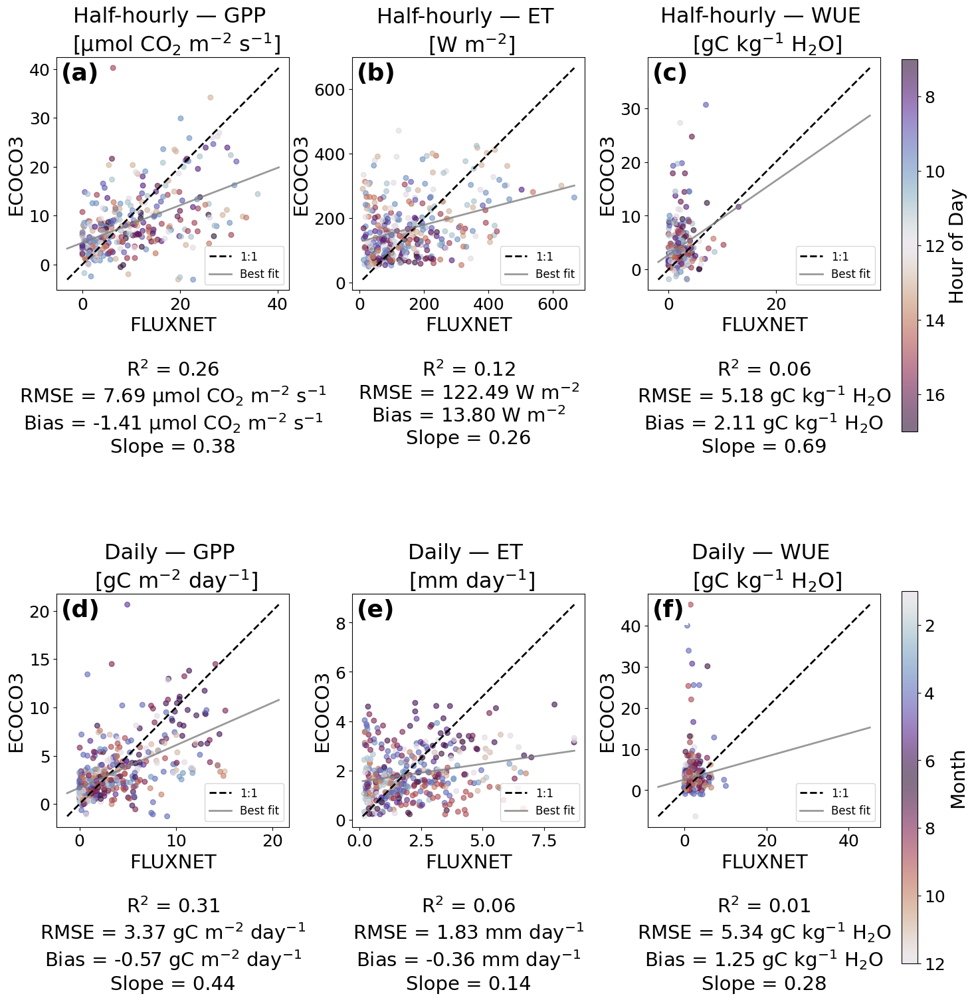

In [5]:
#df_coincident = df_coincident[(df_coincident['WUE_FLUX'] < 10) & (df_coincident['WUE_ECO'] < 10)]
#df_coincident_daily = df_coincident_daily[(df_coincident_daily['WUE_FLUX'] < 10) & (df_coincident_daily['WUE_ECO'] < 10)]
af.plot_flux_vs_eco(df_coincident, df_coincident_daily, output_path='figures/C2_validation/Figure2.png')

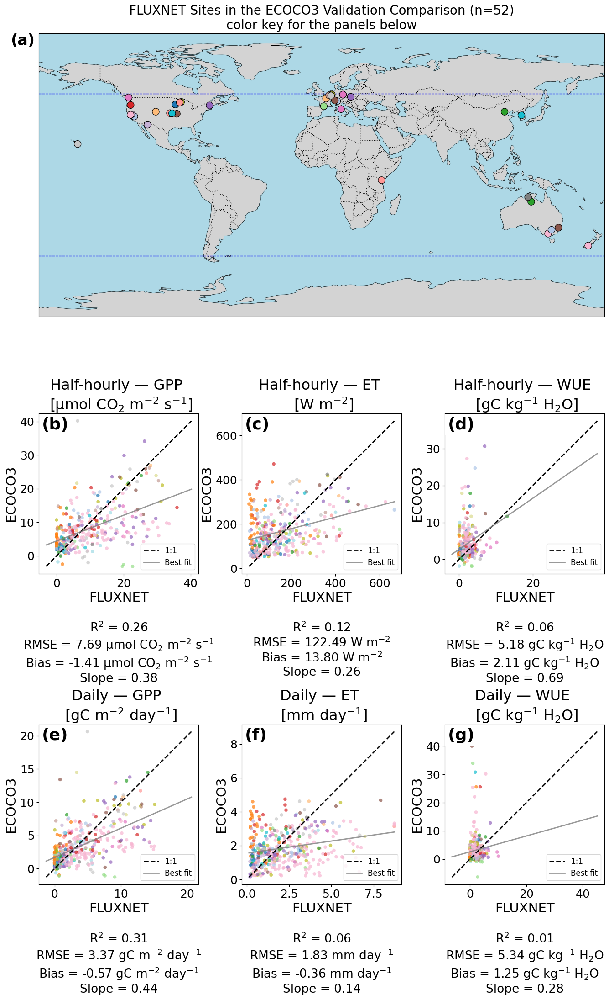

In [6]:
metadata_sites = pd.read_csv('data/FLUXNET_Data_Shuttle/FLUXNET_metadata_successful_daily_sites.csv')
metadata_sites.rename(columns={'Site ID': 'Site'}, inplace=True)

# Figure 2, colored by site instead of hour-of-day/month, with the site
# location map (the color key) combined into the same figure.
coincident_sites, site_colors = af.plot_flux_vs_eco_by_site_map(
    df_coincident, df_coincident_daily, metadata=metadata_sites,
    output_path='figures/C2_validation/Figure2_by_site.png'
)

In [8]:
group_stats = af.compute_group_error_stats(
    df_coincident, df_coincident_daily, metadata=metadata_sites
)
group_stats.to_csv('tables/figure2_error_stats_by_group.csv', index=False)
print(f"Rows: {len(group_stats)}")
group_stats.sort_values(['Grouping', 'Resolution', 'Variable', 'Group'])

Rows: 207


,Resolution,Grouping,Group,Variable,n,R2,RMSE,Bias,Slope
100,Daily,Site,AU-Stp,ET,6,0.811561,0.691744,0.589441,0.748782
103,Daily,Site,AU-Wom,ET,8,0.522083,0.840537,-0.554027,0.665839
106,Daily,Site,AU-Ync,ET,19,0.251781,1.167098,-0.279975,0.267451
109,Daily,Site,CZ-BK1,ET,20,0.721326,0.791417,-0.270441,0.629531
112,Daily,Site,DE-RuS,ET,14,0.437435,1.933537,-1.370171,0.246257
...,...,...,...,...,...,...,...,...,...
53,Half-hourly,kg_label,Csa,WUE,22,0.002320,10.864730,3.486117,0.169904
56,Half-hourly,kg_label,Dfa,WUE,22,0.203298,6.137114,3.973256,0.905312
59,Half-hourly,kg_label,Dfb,WUE,41,0.107507,5.217357,1.773698,1.100669
62,Half-hourly,kg_label,Dfc,WUE,10,0.634062,7.957232,3.995448,4.538082


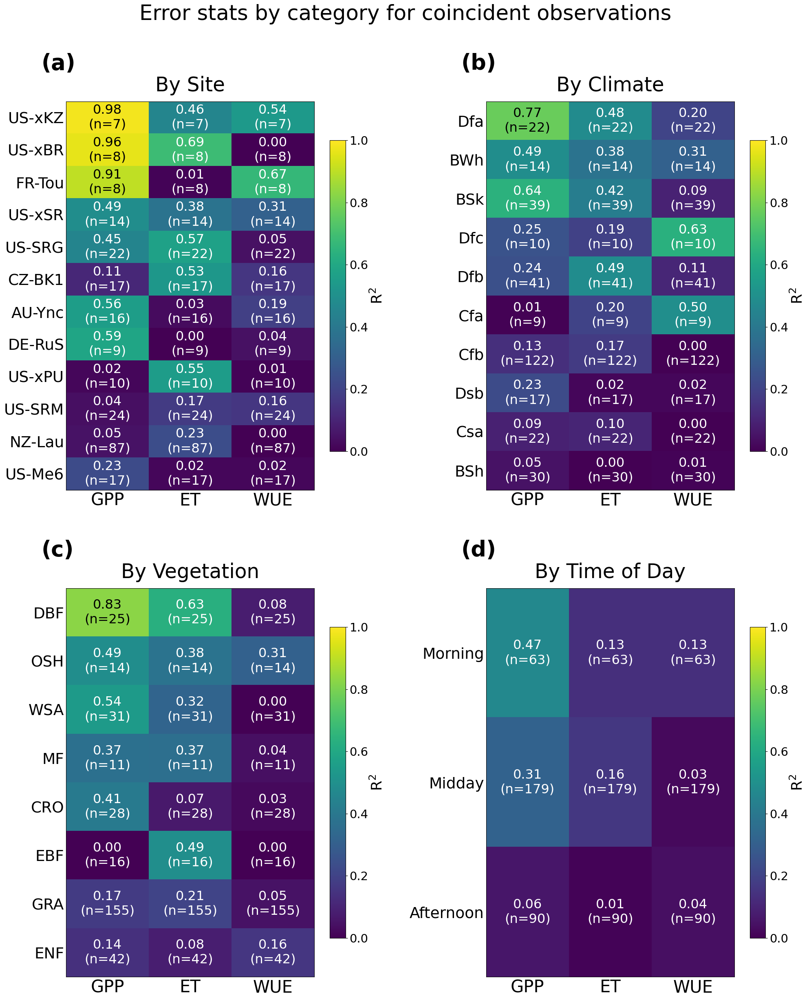

In [9]:
af.plot_group_error_summary(
    group_stats, resolution='Half-hourly', metric='R2',
    output_path='figures/C2_validation/Figure2_error_stats_by_group.png'
)

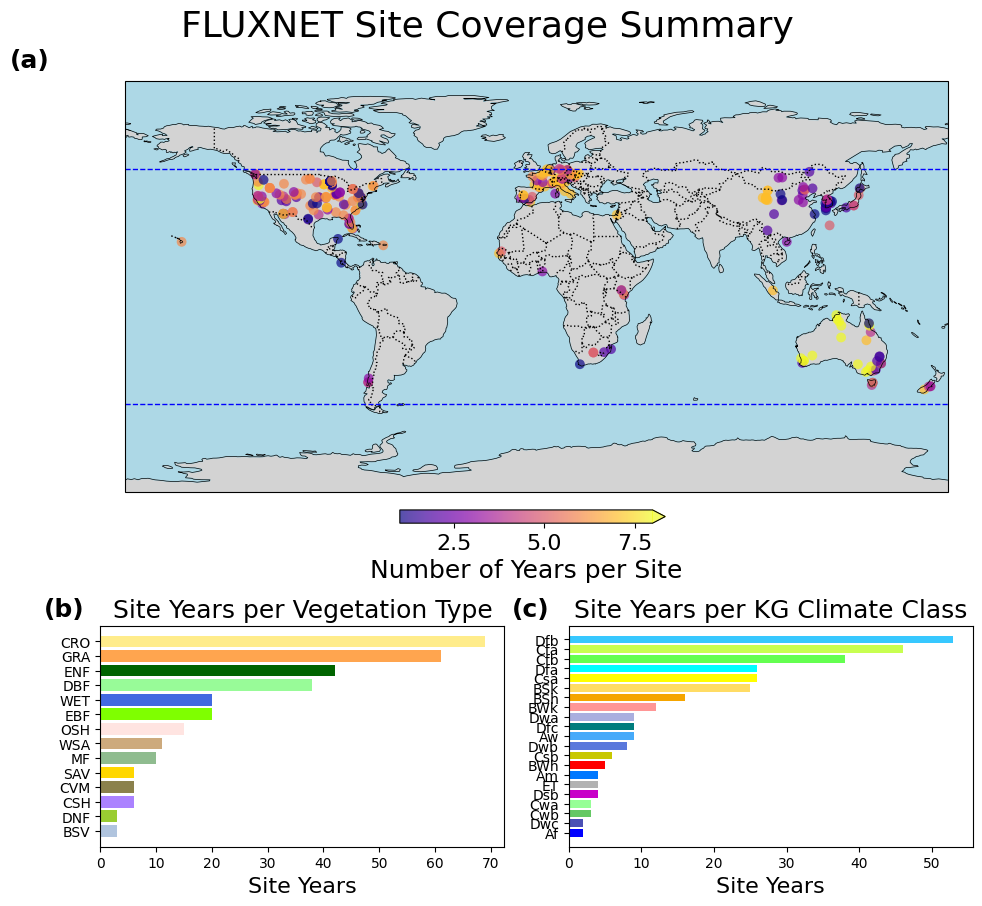

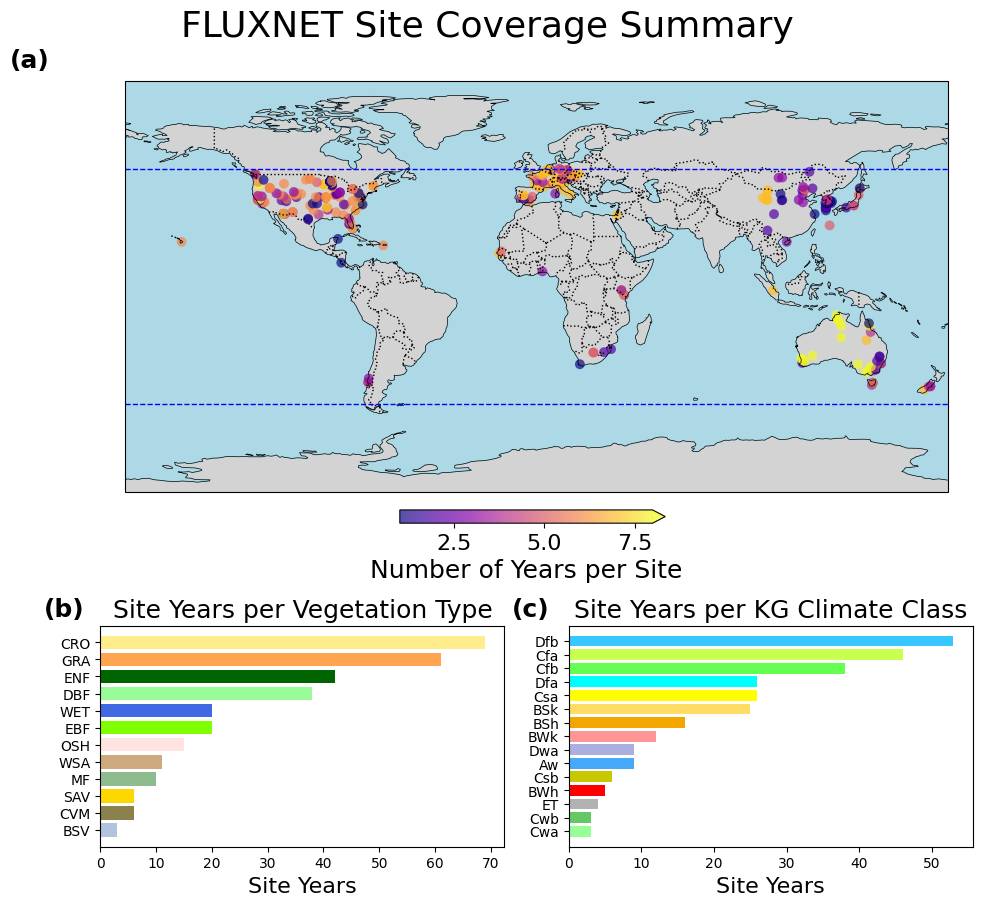

In [10]:
metadata = pd.read_csv('data/FLUXNET_Data_Shuttle/FLUXNET_metadata_successful_daily_sites.csv')

plot_scripts.plot_data_coverage_map_sites(metadata, valid_veg=None, valid_kg=None)
plot_scripts.plot_data_coverage_map_sites(
    metadata, valid_veg=valid_veg, valid_kg=valid_kg,
    output_path='figures/C2_validation/FLUXNET_site_coverage_summary.png'
)

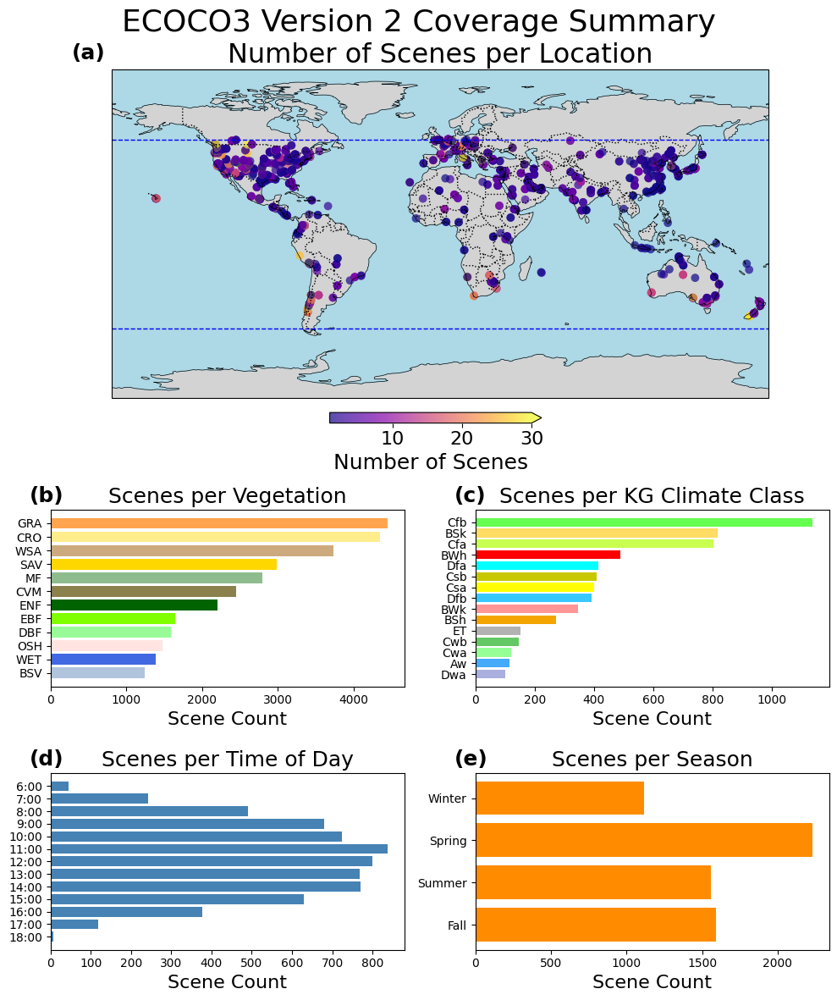

Scenes per vegetation class:
Veg
BSV    1245
CRO    4347
CSH     397
CVM    2446
DBF    1590
DNF      19
EBF    1650
ENF    2200
GRA    4448
MF     2798
OSH    1476
SAV    2990
SNO     372
URB    4259
WAT    3219
WET    1393
WSA    3733
Name: count, dtype: int64

Scenes per climate class:
kg_class
1.0      124
2.0      487
3.0      653
4.0     1369
5.0     1242
6.0     1232
7.0     4277
8.0     2835
9.0     3200
11.0     875
12.0     916
14.0    5362
15.0    7646
16.0     967
18.0     428
19.0     924
21.0     616
23.0      75
25.0    2302
26.0    2103
27.0     168
29.0     781
Name: count, dtype: int64

Total scenes (valid veg AND valid KG): 0


In [11]:
# ======================================================
# Plot ECOCO3 coverage summary: map of scenes per location + bar charts of scenes per vegetation/climate
# ======================================================

plot_scripts.plot_data_coverage_map(df_wue_hh_ecoco3, valid_kg=valid_kg, valid_veg=valid_veg, output_path='figures/C2_validation/Figure1.png')

# ======================================================
# Count scenes per vegetation class
# ======================================================
veg_counts = df_wue_hh_ecoco3['Veg'].value_counts().sort_index()
print("Scenes per vegetation class:")
print(veg_counts)

# ======================================================
# Count scenes per climate class
# ======================================================
kg_counts = df_wue_hh_ecoco3['kg_class'].value_counts().sort_index()
print("\nScenes per climate class:")
print(kg_counts)

df_valid = df_wue_hh_ecoco3[
    df_wue_hh_ecoco3['Veg'].isin(valid_veg) & 
    df_wue_hh_ecoco3['kg_class'].isin(valid_kg)
]
print(f"\nTotal scenes (valid veg AND valid KG): {df_valid.shape[0]}")

In [12]:
# Restrict to categories with sufficient data in BOTH dimensions (same
# concept as df_valid in the coverage-map cell above) -- the two conditions
# used to be assigned separately and the second silently overwrote the
# first, so every downstream figure/table was actually climate-filtered
# only, never vegetation-filtered.
df_flux = df_wue_hh_fluxnet[
    df_wue_hh_fluxnet['Veg'].isin(valid_veg) & df_wue_hh_fluxnet['kg_label'].isin(valid_kg)
]
df_ecoco = df_wue_hh_ecoco3[
    df_wue_hh_ecoco3['Veg'].isin(valid_veg) & df_wue_hh_ecoco3['kg_label'].isin(valid_kg)
]

df_flux_summer = df_flux[df_flux['Season'] == 'Summer']
df_ecoco_summer = df_ecoco[df_ecoco['Season'] == 'Summer']

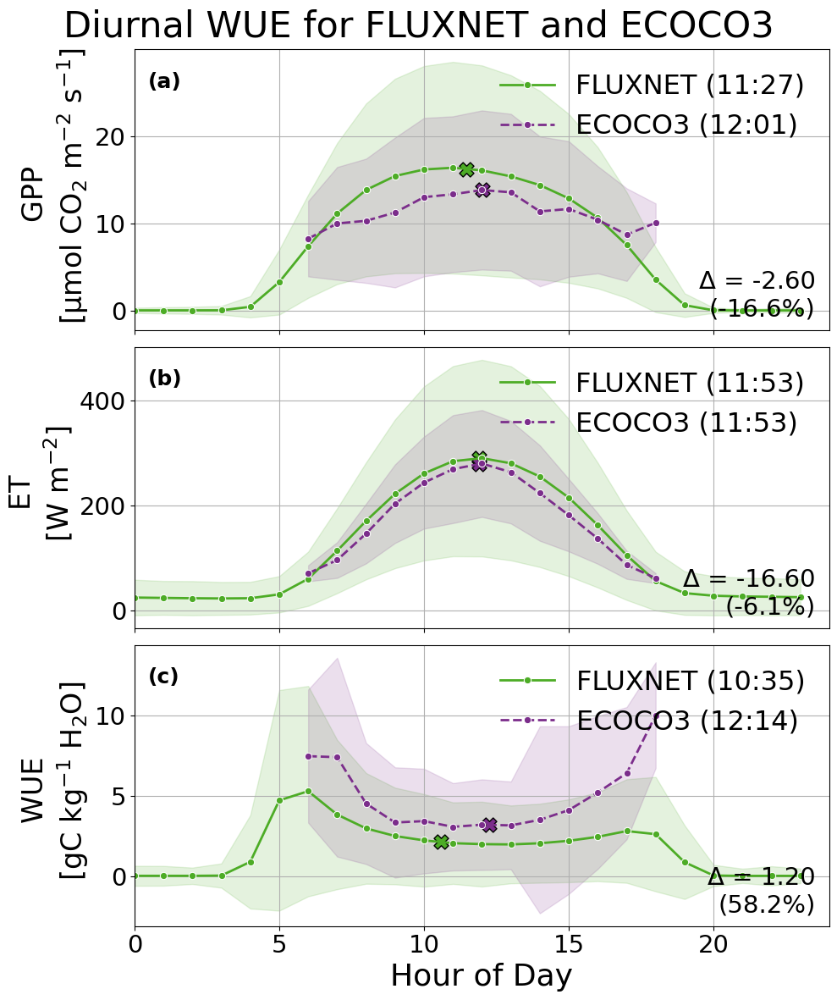

,Variable,Flux Midday Mean,ECOCO Midday Mean,Midday Difference (ECOCO - FLUX),95% CI Lower (bootstrap),95% CI Upper (bootstrap),Flux Centroid (hr),ECOCO Centroid (hr),Flux Centroid (time),ECOCO Centroid (time),Centroid Difference (hr)
0,GPP,15.671522,13.075896,-2.595626,-2.888112,-2.301992,11.465283,12.021912,11:27,12:01,0.556629
1,ET,273.993796,257.391749,-16.602046,-19.819263,-13.396661,11.888394,11.889392,11:53,11:53,0.000998
2,WUE,2.065512,3.267733,1.202221,1.082349,1.320106,10.589301,12.241066,10:35,12:14,1.651765


In [13]:
plot_scripts.plot_merged_diurnal_cycles(df_flux_summer, df_ecoco_summer, title='Diurnal WUE for FLUXNET and ECOCO3',
                                        output_path='figures/C2_validation/Figure4.png')

/Users/zoepierratucsb/Documents/ECOCO3/plot_scripts.py:935: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


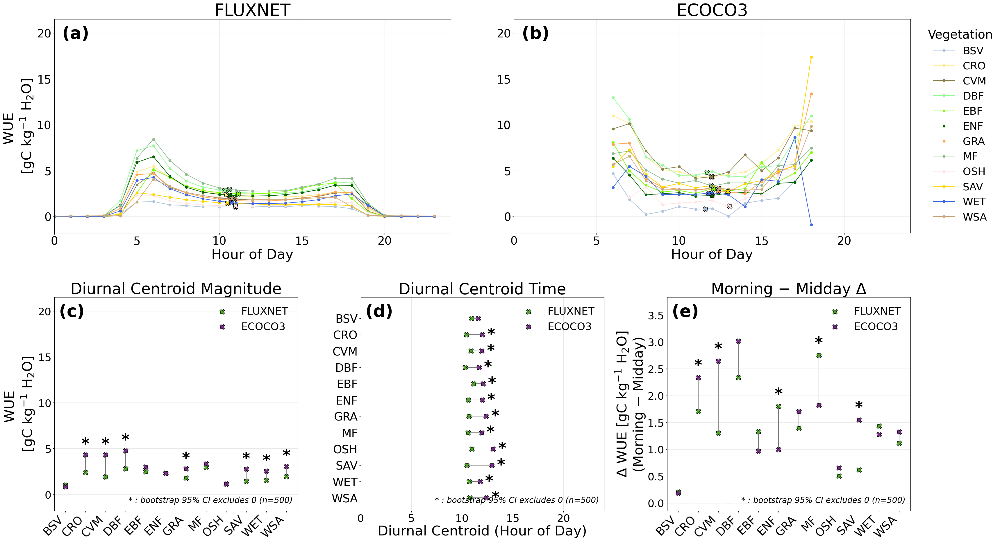

,Hour_diff,Hour_CI_low,Hour_CI_high,Hour_sig,Value_diff,Value_CI_low,Value_CI_high,Value_sig,Delta_diff,Delta_CI_low,Delta_CI_high,Delta_sig
Veg,,,,,,,,,,,,
BSV,-0.623854,-3.140444,1.438090,False,0.277605,-0.720435,1.454303,False,0.020596,-1.084873,1.133856,False
CRO,-1.583080,-1.801859,-1.344235,True,-1.961687,-2.540350,-1.469422,True,-0.628819,-1.305106,-0.023517,True
CVM,-1.068402,-1.315018,-0.809954,True,-2.455311,-3.118008,-1.857808,True,-1.341169,-2.252036,-0.505500,True
DBF,-1.376647,-1.724565,-1.083037,True,-1.974311,-2.573577,-1.439926,True,-0.686365,-1.834794,0.312472,False
EBF,-0.920249,-1.303752,-0.558085,True,-0.513436,-1.773101,0.179622,False,0.361361,-0.363828,1.135885,False
ENF,-1.375319,-1.821913,-0.956188,True,0.016245,-0.399906,0.344741,False,0.806817,0.305718,1.254385,True
GRA,-1.690779,-1.968552,-1.407469,True,-1.010067,-1.287469,-0.756616,True,-0.306699,-0.979250,0.426998,False
MF,-1.326038,-1.612358,-1.040578,True,-0.407435,-0.919576,0.022871,False,0.929455,0.293025,1.630085,True
OSH,-2.081249,-2.875983,-1.384899,True,-0.196366,-0.964484,0.515081,False,-0.152732,-1.043883,0.616354,False


In [14]:
df_flux_veg_summer = df_wue_hh_fluxnet[df_wue_hh_fluxnet['Veg'].isin(valid_veg) & (df_wue_hh_fluxnet['Season'] == 'Summer')]
df_ecoco_veg_summer = df_wue_hh_ecoco3[df_wue_hh_ecoco3['Veg'].isin(valid_veg) & (df_wue_hh_ecoco3['Season'] == 'Summer')]

diurnal_veg_centroids, diurnal_veg_comparisons = plot_scripts.plot_diurnal_veg_comparison(
    df_flux_veg_summer, df_ecoco_veg_summer, valid_veg,
    output_path='figures/C2_validation/diurnal_wue_by_veg.png'
)
diurnal_veg_comparisons

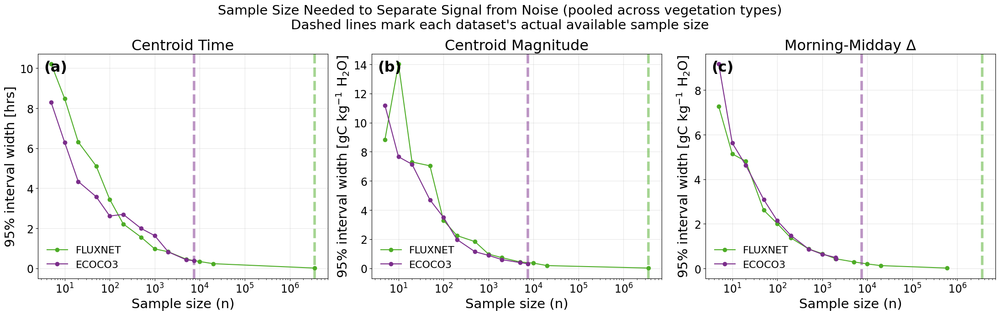

In [16]:
power_curves = plot_scripts.plot_sample_size_power_curves(
    df_flux_veg_summer, df_ecoco_veg_summer,
    output_path='figures/C2_validation/sample_size_power_curves.png'
)

In [19]:
spei_bins = [
    ("Drought", lambda df: df['SPEI'] < -1.5,),
    ("Non-Drought", lambda df: df['SPEI'] > 0),
]

In [20]:
all_records = []
supp_records = []
shift_records = []

for var in valid_veg:
    df_ecoco_var = df_ecoco_summer[df_ecoco_summer['Veg'] == var]
    df_flux_var  = df_flux_summer[df_flux_summer['Veg'] == var]

    df_ecoco_centroids = plot_scripts.plot_diurnal_cycles_spei(
        df_ecoco_var, spei_bins, title=f'Diurnal WUE by Vegetation Type (ECOCO) - {var}'
    )
    df_flux_centroids = plot_scripts.plot_diurnal_cycles_spei(
        df_flux_var, spei_bins, title=f'Diurnal WUE by Vegetation Type (FLUXNET) - {var}'
    )

    df_ecoco_centroids['veg'] = var
    df_ecoco_centroids['dataset'] = 'ECOCO'
    df_flux_centroids['veg'] = var
    df_flux_centroids['dataset'] = 'FLUXNET'

    all_records += [df_ecoco_centroids, df_flux_centroids]

    ecoco_supp = df_ecoco_centroids[df_ecoco_centroids["SPEI Bin"] == "Midday drought - non-drought"].copy()
    flux_supp  = df_flux_centroids[df_flux_centroids["SPEI Bin"] == "Midday drought - non-drought"].copy()
    ecoco_supp[["veg", "dataset"]] = var, "ECOCO"
    flux_supp[["veg", "dataset"]]  = var, "FLUXNET"
    supp_records += [ecoco_supp, flux_supp]

    ecoco_shift = df_ecoco_centroids[df_ecoco_centroids["SPEI Bin"] == "Centroid shift (Drought - Non-Drought)"].copy()
    flux_shift  = df_flux_centroids[df_flux_centroids["SPEI Bin"] == "Centroid shift (Drought - Non-Drought)"].copy()
    ecoco_shift[["veg", "dataset"]] = var, "ECOCO"
    flux_shift[["veg", "dataset"]]  = var, "FLUXNET"
    shift_records += [ecoco_shift, flux_shift]

df_centroids = pd.concat(all_records, ignore_index=True)
df_supp = pd.concat(supp_records, ignore_index=True)
df_shift = pd.concat(shift_records, ignore_index=True)

df_pivot = df_centroids.pivot_table(
    index=['Variable', 'veg', 'SPEI Bin'],
    columns='dataset',
    values='Centroid Hour'
).reset_index()

df_pivot['Difference (hrs)'] = (df_pivot['ECOCO'] - df_pivot['FLUXNET']).round(2)
df_pivot = df_pivot.dropna()

df_pivot['ECOCO']   = df_pivot['ECOCO'].apply(plot_scripts.hour_to_timestamp)
df_pivot['FLUXNET'] = df_pivot['FLUXNET'].apply(plot_scripts.hour_to_timestamp)

df_pivot_supp = df_supp.pivot_table(
    index=['Variable', 'veg'],
    columns='dataset',
    values=['Midday Δ', 'CI 2.5%', 'CI 97.5%', '% Change', 'N drought days', 'N non-drought days'],
    aggfunc='mean'
).reset_index()

df_pivot = df_pivot.round(2)
df_pivot_supp = df_pivot_supp.round(2)

df_shift['dataset'] = pd.Categorical(df_shift['dataset'], categories=['ECOCO', 'FLUXNET'])
df_pivot_shift = df_shift.pivot_table(
    index=['Variable', 'veg'],
    columns='dataset',
    values=['Centroid Shift (hrs)', 'Shift CI 2.5%', 'Shift CI 97.5%'],
    aggfunc='mean',
    dropna=False,
    observed=False
).reset_index()
df_pivot_shift = df_pivot_shift.round(2)

df_pivot.to_csv('tables/centroid_summary_V2.csv', index=False)
df_pivot_supp.to_csv('tables/suppression_summary_midday_V2.csv', index=False)
df_pivot_shift.to_csv('tables/centroid_shift_summary_V2.csv', index=False)

In [21]:
all_records = []
supp_records = []
shift_records = []

valid_kg_eco = af.sufficient_drought_days(df_ecoco_summer, 'kg_label', spei_bins)
dropped_kg = sorted(set(valid_kg) - set(valid_kg_eco))
if dropped_kg:
    print(f"Dropping climate classes with insufficient ECOCO3 drought/non-drought days (SPEI): {dropped_kg}")

for var in valid_kg_eco:
    df_ecoco_var = df_ecoco_summer[df_ecoco_summer['kg_label'] == var]
    df_flux_var  = df_flux_summer[df_flux_summer['kg_label'] == var]

    df_ecoco_centroids = plot_scripts.plot_diurnal_cycles_spei(
        df_ecoco_var, spei_bins, title=f'Diurnal WUE by Climate Type (ECOCO) - {var}'
    )
    df_flux_centroids = plot_scripts.plot_diurnal_cycles_spei(
        df_flux_var, spei_bins, title=f'Diurnal WUE by Climate Type (FLUXNET) - {var}'
    )

    df_ecoco_centroids['kg_label'] = var
    df_ecoco_centroids['dataset'] = 'ECOCO'
    df_flux_centroids['kg_label'] = var
    df_flux_centroids['dataset'] = 'FLUXNET'

    all_records += [df_ecoco_centroids, df_flux_centroids]

    if len(df_ecoco_centroids) == 0 or len(df_flux_centroids) == 0:
        continue

    ecoco_supp = df_ecoco_centroids[df_ecoco_centroids["SPEI Bin"] == "Midday drought - non-drought"].copy()
    flux_supp  = df_flux_centroids[df_flux_centroids["SPEI Bin"] == "Midday drought - non-drought"].copy()
    ecoco_supp[["kg_label", "dataset"]] = var, "ECOCO"
    flux_supp[["kg_label", "dataset"]]  = var, "FLUXNET"
    supp_records += [ecoco_supp, flux_supp]

    ecoco_shift = df_ecoco_centroids[df_ecoco_centroids["SPEI Bin"] == "Centroid shift (Drought - Non-Drought)"].copy()
    flux_shift  = df_flux_centroids[df_flux_centroids["SPEI Bin"] == "Centroid shift (Drought - Non-Drought)"].copy()
    ecoco_shift[["kg_label", "dataset"]] = var, "ECOCO"
    flux_shift[["kg_label", "dataset"]]  = var, "FLUXNET"
    shift_records += [ecoco_shift, flux_shift]

df_centroids = pd.concat(all_records, ignore_index=True)
df_supp = pd.concat(supp_records, ignore_index=True)
df_shift = pd.concat(shift_records, ignore_index=True)

df_pivot = df_centroids.pivot_table(
    index=['Variable', 'kg_label', 'SPEI Bin'],
    columns='dataset',
    values='Centroid Hour'
).reset_index()

df_pivot['Difference (hrs)'] = (df_pivot['ECOCO'] - df_pivot['FLUXNET']).round(2)
df_pivot = df_pivot.dropna()

df_pivot['ECOCO']   = df_pivot['ECOCO'].apply(plot_scripts.hour_to_timestamp)
df_pivot['FLUXNET'] = df_pivot['FLUXNET'].apply(plot_scripts.hour_to_timestamp)

df_pivot_supp = df_supp.pivot_table(
    index=['Variable', 'kg_label'],
    columns='dataset',
    values=['Midday Δ', 'CI 2.5%', 'CI 97.5%', '% Change', 'N drought days', 'N non-drought days'],
    aggfunc='mean'
).reset_index()

df_pivot = df_pivot.round(2)
df_pivot_supp = df_pivot_supp.round(2).dropna()

df_shift['dataset'] = pd.Categorical(df_shift['dataset'], categories=['ECOCO', 'FLUXNET'])
df_pivot_shift = df_shift.pivot_table(
    index=['Variable', 'kg_label'],
    columns='dataset',
    values=['Centroid Shift (hrs)', 'Shift CI 2.5%', 'Shift CI 97.5%'],
    aggfunc='mean',
    dropna=False,
    observed=False
).reset_index()
df_pivot_shift = df_pivot_shift.round(2)

df_pivot.to_csv('tables/centroid_summary_kg_V2.csv', index=False)
df_pivot_supp.to_csv('tables/suppression_summary_midday_kg_V2.csv', index=False)
df_pivot_shift.to_csv('tables/centroid_shift_summary_kg_V2.csv', index=False)

Dropping climate classes with insufficient ECOCO3 drought/non-drought days (SPEI): ['Aw', 'BSh', 'Cwa', 'Cwb', 'Dwa', 'ET']


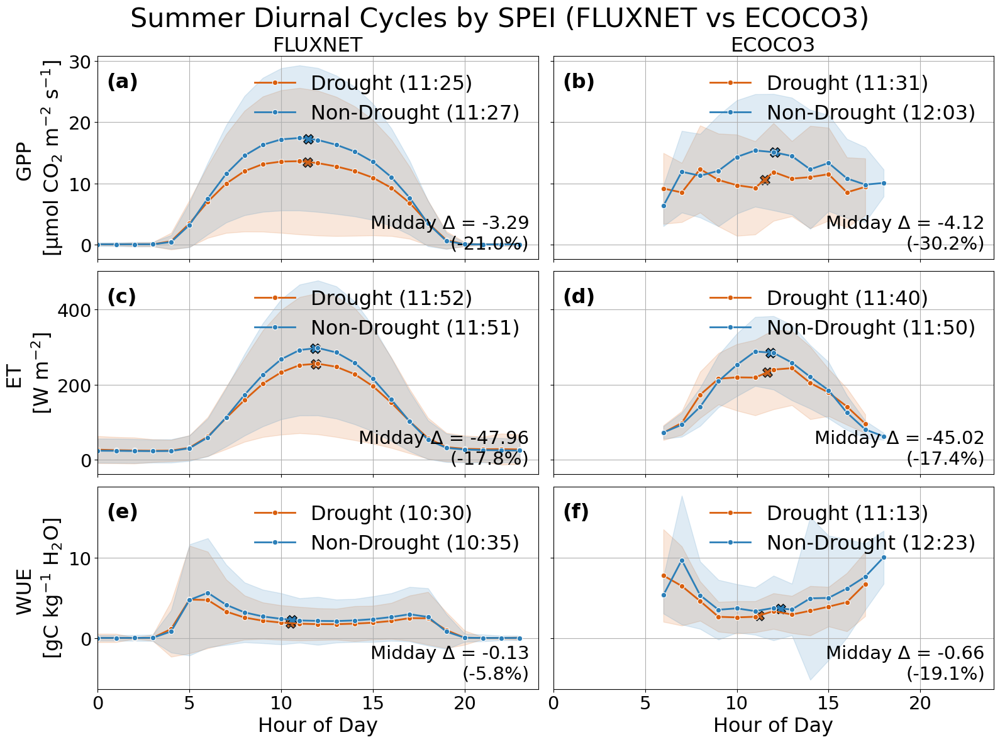

,Dataset,Variable,SPEI Bin,Centroid Hour,Centroid Time,Midday Δ,% Change,CI 2.5%,CI 97.5%,N drought days,N non-drought days
0,FLUXNET,GPP,Drought,11.429361,11:25,NaN,NaN,NaN,NaN,NaN,NaN
1,FLUXNET,GPP,Non-Drought,11.459237,11:27,NaN,NaN,NaN,NaN,NaN,NaN
2,FLUXNET,GPP,Midday drought - non-drought,NaN,NaN,-3.293724,-20.955524,-3.645031,-2.971705,1247.0,1458.0
3,ECOCO3,GPP,Drought,11.521855,11:31,NaN,NaN,NaN,NaN,NaN,NaN
4,ECOCO3,GPP,Non-Drought,12.057140,12:03,NaN,NaN,NaN,NaN,NaN,NaN
5,ECOCO3,GPP,Midday drought - non-drought,NaN,NaN,-4.118896,-30.172104,-6.028826,-2.497127,83.0,170.0
6,FLUXNET,ET,Drought,11.879573,11:52,NaN,NaN,NaN,NaN,NaN,NaN
7,FLUXNET,ET,Non-Drought,11.857313,11:51,NaN,NaN,NaN,NaN,NaN,NaN
8,FLUXNET,ET,Midday drought - non-drought,NaN,NaN,-47.961478,-17.818839,-53.658187,-42.407437,1247.0,1458.0
9,ECOCO3,ET,Drought,11.675581,11:40,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
plot_scripts.plot_diurnal_cycles_spei_comparison(
    df_ecoco3=df_ecoco_summer,
    df_fluxnet=df_flux_summer,
    spei_bins=spei_bins,
    title='Summer Diurnal Cycles by SPEI',
    output_path='figures/C2_validation/Figure5.png'
)

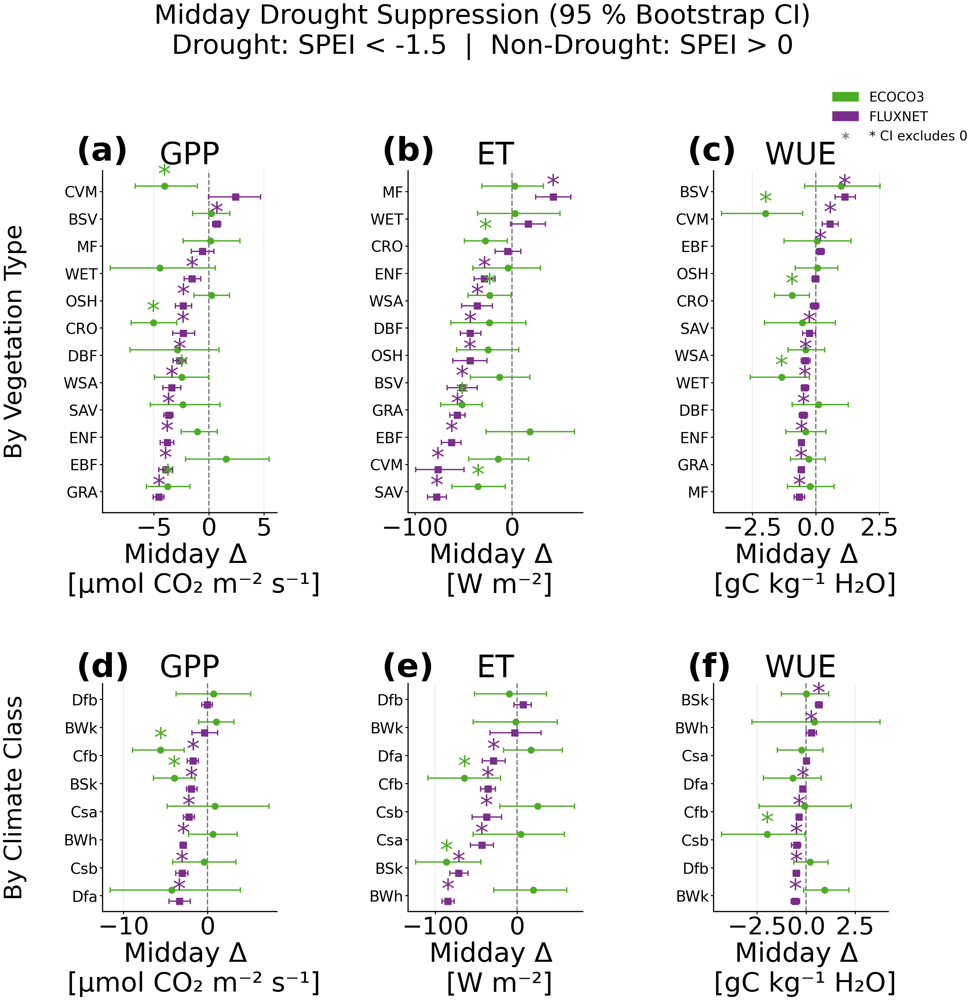

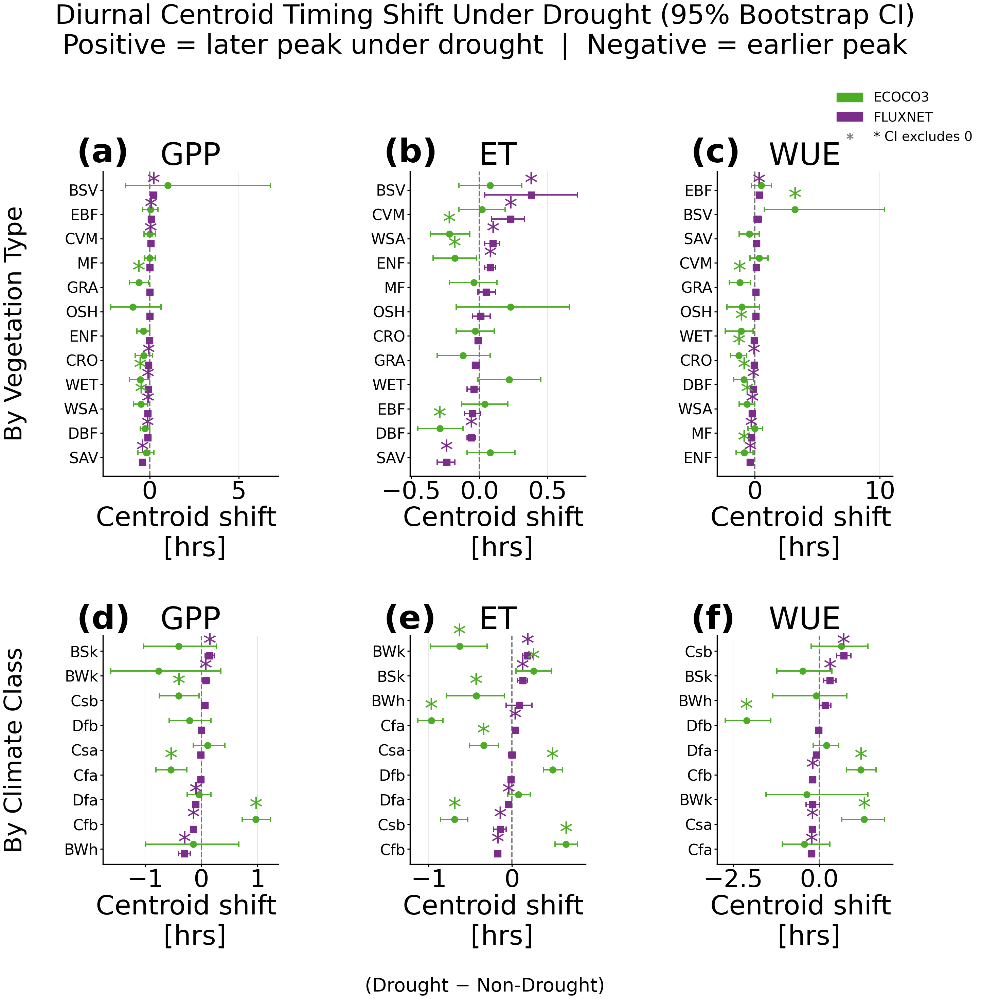

In [27]:
plot_scripts.plot_drought_suppression_summary(
    sup_veg_path='tables/suppression_summary_midday_V2.csv',
    sup_kg_path='tables/suppression_summary_midday_kg_V2.csv',
    output_path='figures/C2_validation/drought_suppression_summary.png'
)
plot_scripts.plot_centroid_shift_summary(
    shift_veg_path='tables/centroid_shift_summary_V2.csv',
    shift_kg_path='tables/centroid_shift_summary_kg_V2.csv',
    output_path='figures/C2_validation/centroid_shift_summary.png'
)

## SPI-based drought analysis (parallel to the SPEI analysis above)

In [29]:
spi_bins = [
    ("Drought", lambda df: df['SPI'] < -1.5,),
    ("Non-Drought", lambda df: df['SPI'] > 0),
]


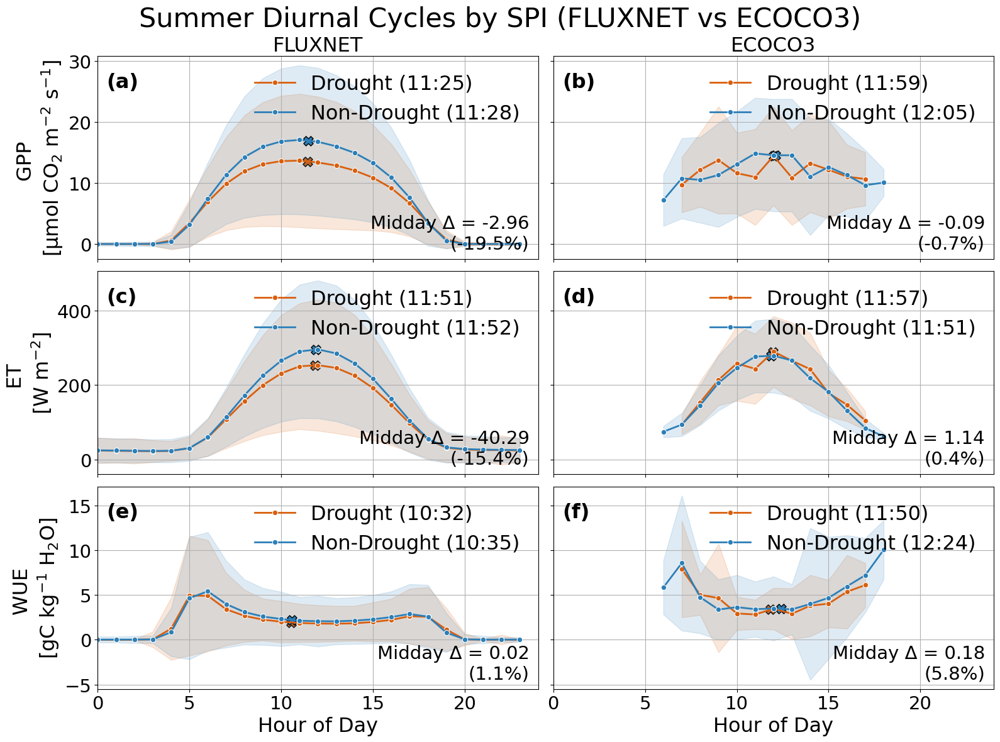

,Dataset,Variable,SPI Bin,Centroid Hour,Centroid Time,Midday Δ,% Change,CI 2.5%,CI 97.5%,N drought days,N non-drought days
0,FLUXNET,GPP,Drought,11.426383,11:25,NaN,NaN,NaN,NaN,NaN,NaN
1,FLUXNET,GPP,Non-Drought,11.467559,11:28,NaN,NaN,NaN,NaN,NaN,NaN
2,FLUXNET,GPP,Midday drought - non-drought,NaN,NaN,-2.957277,-19.532519,-3.321190,-2.580620,1308.0,1458.0
3,ECOCO3,GPP,Drought,11.989297,11:59,NaN,NaN,NaN,NaN,NaN,NaN
4,ECOCO3,GPP,Non-Drought,12.094480,12:05,NaN,NaN,NaN,NaN,NaN,NaN
5,ECOCO3,GPP,Midday drought - non-drought,NaN,NaN,-0.087282,-0.685204,-1.990218,1.878434,53.0,196.0
6,FLUXNET,ET,Drought,11.855671,11:51,NaN,NaN,NaN,NaN,NaN,NaN
7,FLUXNET,ET,Non-Drought,11.880852,11:52,NaN,NaN,NaN,NaN,NaN,NaN
8,FLUXNET,ET,Midday drought - non-drought,NaN,NaN,-40.287717,-15.364330,-46.922575,-34.354691,1308.0,1458.0
9,ECOCO3,ET,Drought,11.962798,11:57,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
plot_scripts.plot_diurnal_cycles_spei_comparison(
    df_ecoco3=df_ecoco_summer,
    df_fluxnet=df_flux_summer,
    spei_bins=spi_bins,
    title='Summer Diurnal Cycles by SPI',
    output_path='figures/C2_validation/Figure5_SPI.png',
    index_name='SPI'
)


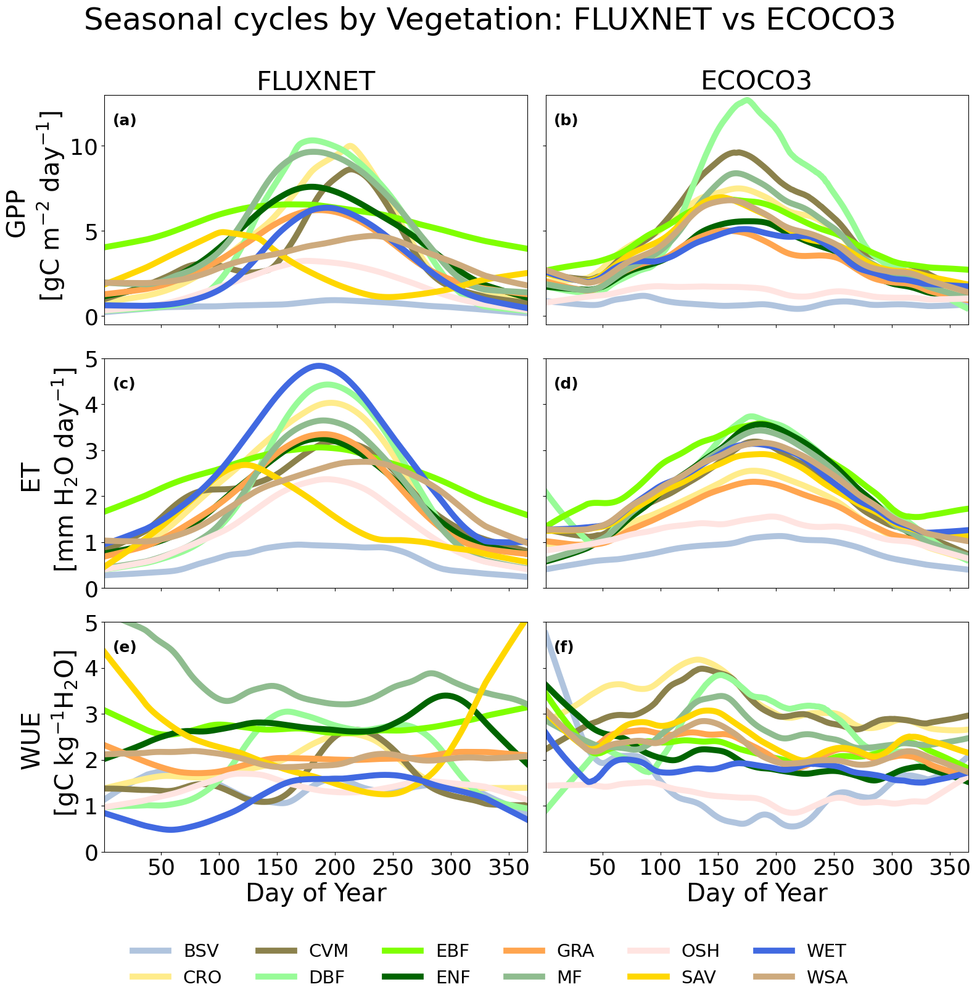

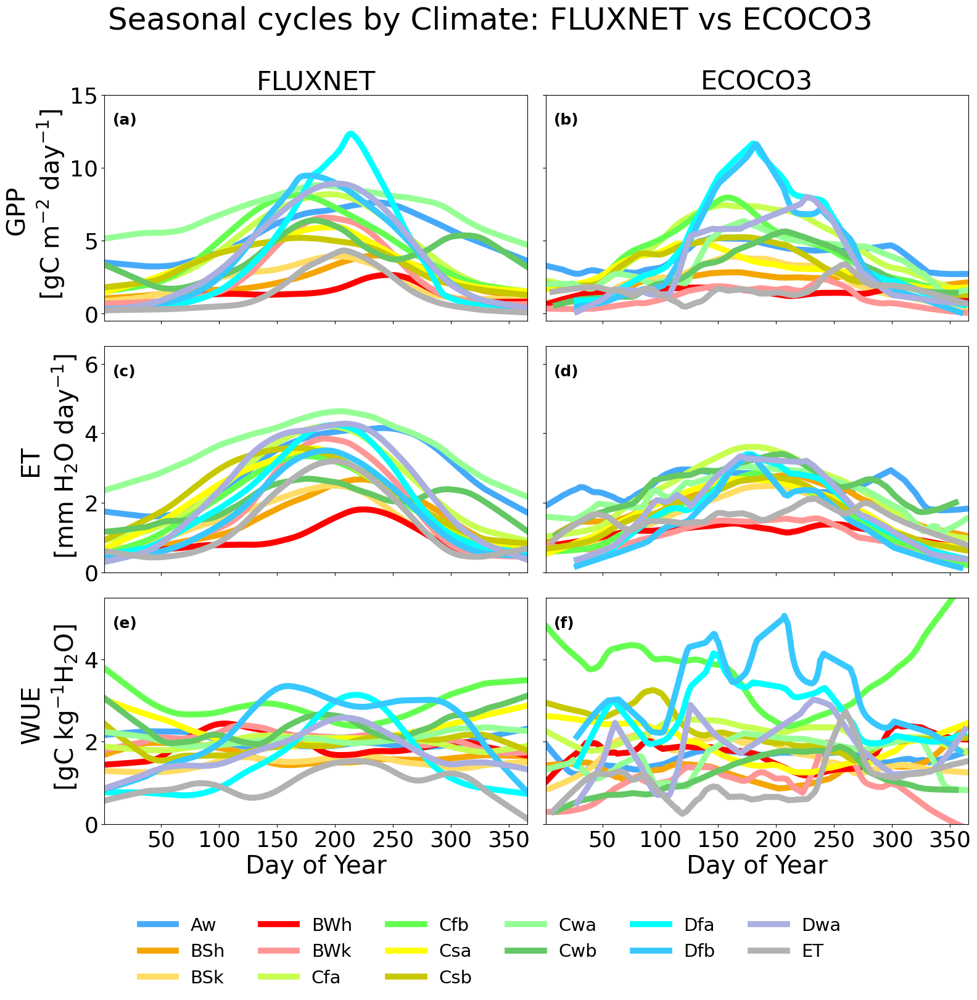

In [37]:
variables = ['GPP', 'ET', 'WUE']
y_labels = ['GPP \n [gC m$^{-2}$ day$^{-1}$]',
            'ET \n [mm H$_2$O day$^{-1}$]',
            'WUE \n [gC kg$^{-1}$H$_2$O]']

plot_scripts.plot_seasonal_cycles_comparison(
    df_fluxnet=df_wue_daily_fluxnet,
    df_ecoco3=df_wue_daily_ecoco3,
    variables=variables,
    y_labels=y_labels,
    group_type='Veg',  # or 'kg_label'
    frac=0.2,
    ylims=[[ -0.5, 13], [0, 5], [0, 5]],
    valid_veg=valid_veg,
    valid_kg=valid_kg,
    output_path='figures/C2_validation/seasonal_cycles_comparison_veg.png'
)

plot_scripts.plot_seasonal_cycles_comparison(
    df_fluxnet=df_wue_daily_fluxnet,
    df_ecoco3=df_wue_daily_ecoco3,
    variables=variables,
    y_labels=y_labels,
    group_type='kg_label',  # or 'kg_label'
    frac=0.2,
    ylims=[[ -0.5, 15], [0, 6.5], [0, 5.5]],
    valid_veg=valid_veg,
    valid_kg=valid_kg,
    output_path='figures/C2_validation/seasonal_cycles_comparison_kg.png'
)

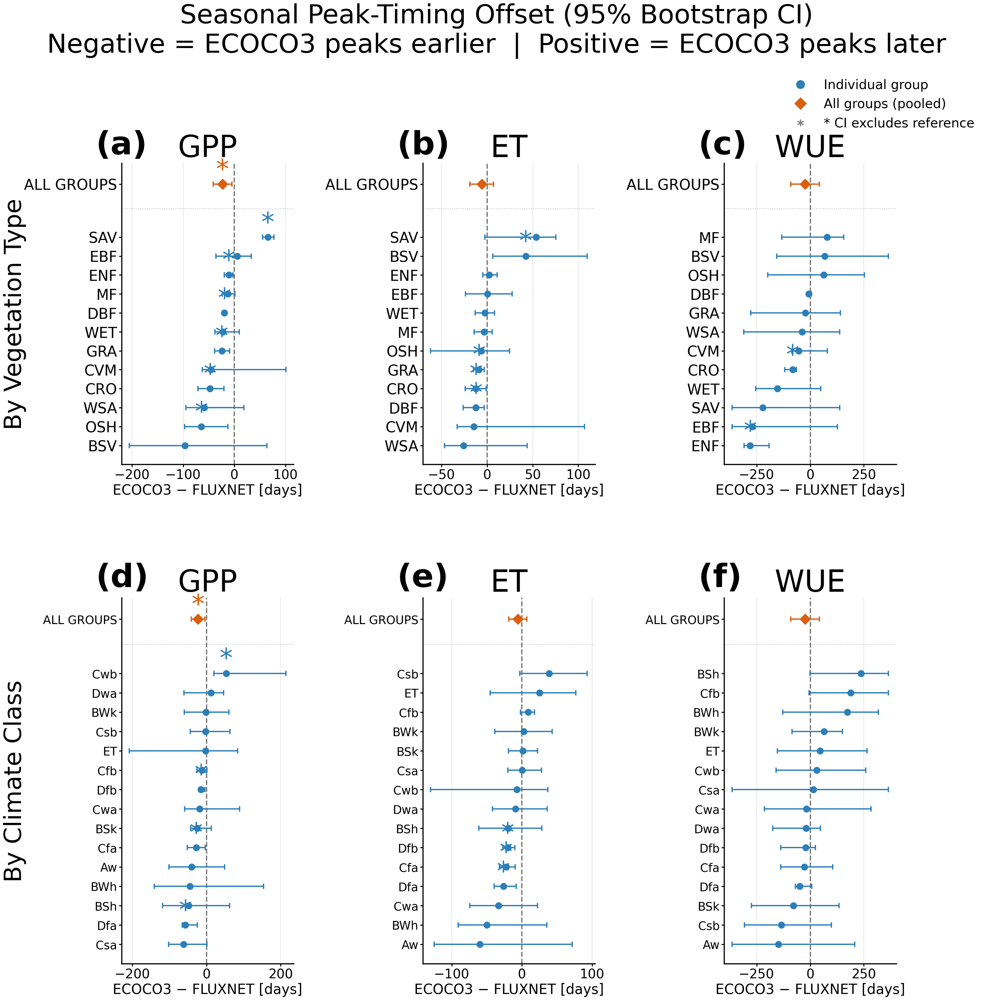

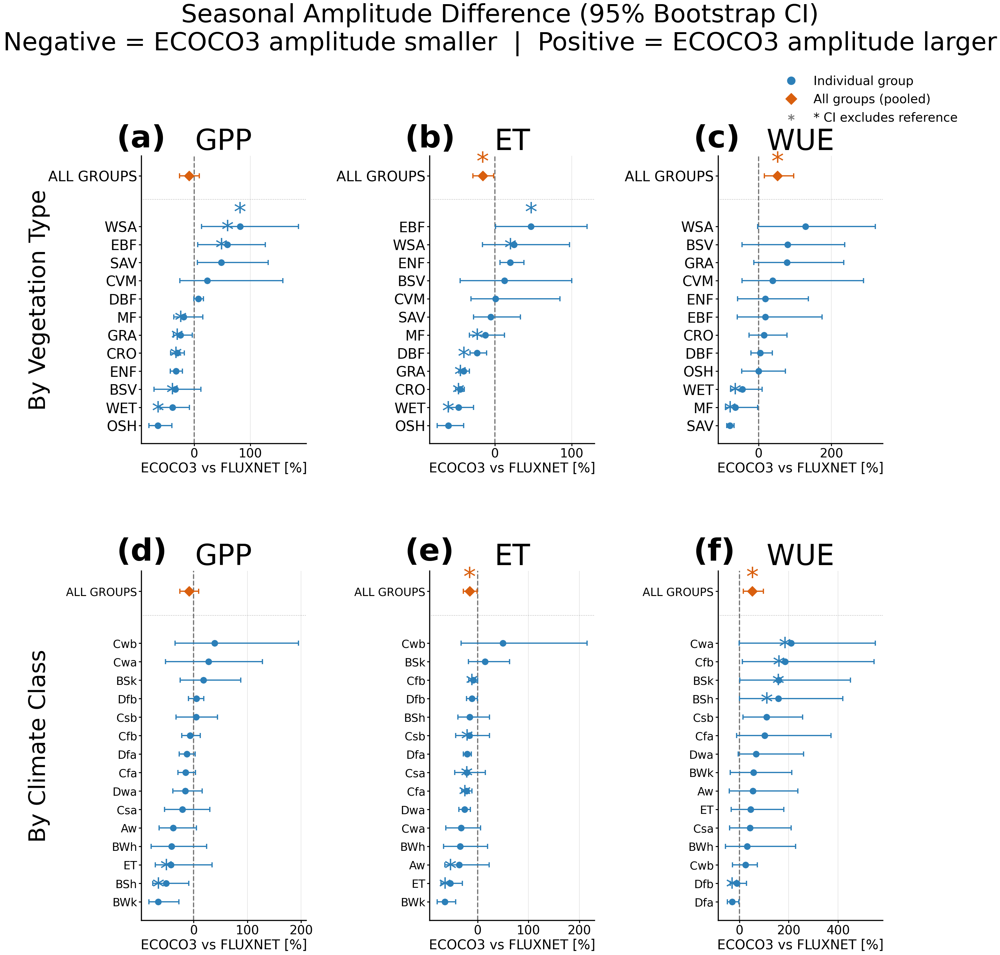

In [39]:
# Forest-plot summary of seasonal peak-timing offset and amplitude difference,
# with 95% bootstrap CIs (per-group + across-group aggregate)
plot_scripts.plot_seasonal_offset_summary(
    metric='offset',
    output_path='figures/C2_validation/seasonal_timing_offset_summary.png'
)

plot_scripts.plot_seasonal_offset_summary(
    metric='pct_amp_diff',
    output_path='figures/C2_validation/seasonal_amplitude_diff_summary.png'
)

/Users/zoepierratucsb/Documents/ECOCO3/plot_scripts.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=grouping_category, y='WUE', data=df_wue_daily, palette=color_map,
/Users/zoepierratucsb/Documents/ECOCO3/plot_scripts.py:142: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(x=grouping_category, y='WUE', data=df_wue_daily, palette=color_map,
/Users/zoepierratucsb/Documents/ECOCO3/plot_scripts.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=grouping_category, y='WUE', data=df_wue_daily, palette=color_map,
/Users/zoepierratucsb/Documents/ECOCO3/plot_scripts.py:142: Fut

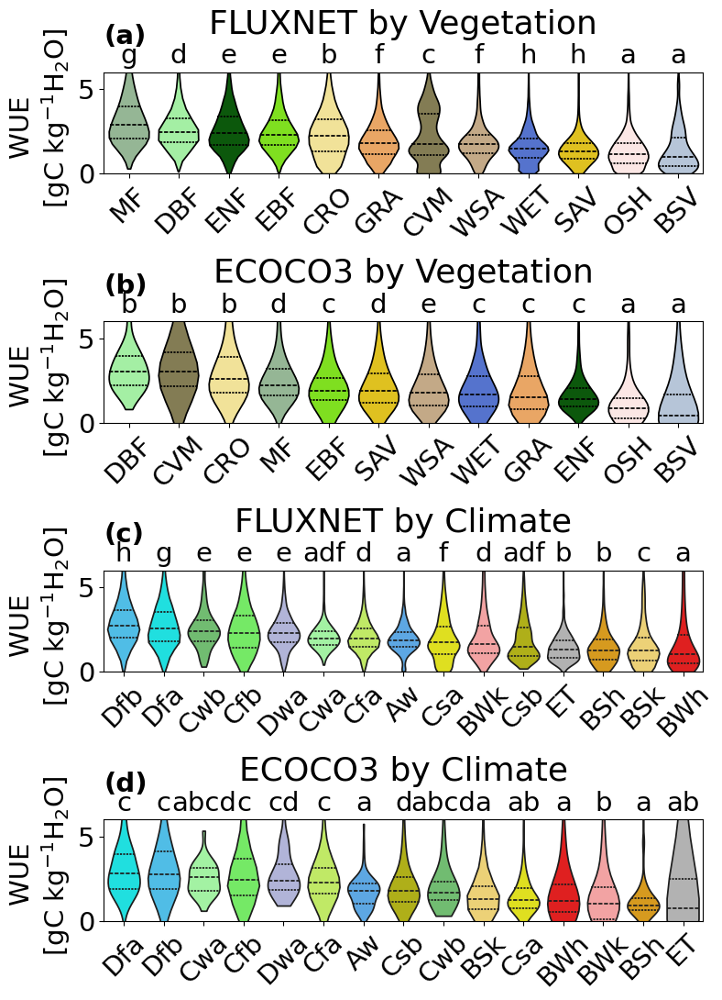

In [40]:
plot_scripts.plot_violin_comparison_stacked(
    df_ecoco3=df_wue_daily_ecoco3[df_wue_daily_ecoco3['Season'] == 'Summer'],
    df_fluxnet=df_wue_daily_fluxnet[df_wue_daily_fluxnet['Season'] == 'Summer'],
    grouping_category='Veg',  # or 'kg_label'
    valid_kg=valid_kg,
    valid_veg=valid_veg,
    output_path='figures/C2_validation/Figure3.png'
)

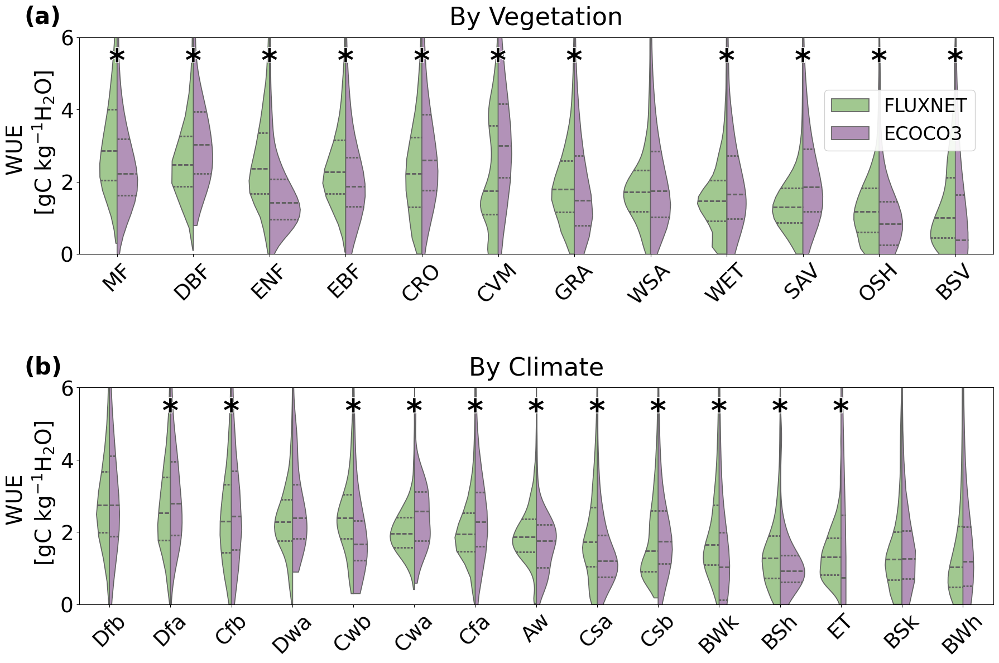

In [41]:
# New companion figure (split violins, FLUXNET vs ECOCO3 directly), keeping Figure3.png as-is
plot_scripts.plot_violin_comparison_split(
    df_ecoco3=df_wue_daily_ecoco3[df_wue_daily_ecoco3['Season'] == 'Summer'],
    df_fluxnet=df_wue_daily_fluxnet[df_wue_daily_fluxnet['Season'] == 'Summer'],
    grouping_category='Veg',
    valid_kg=valid_kg,
    valid_veg=valid_veg,
    output_path='figures/C2_validation/Figure3b.png'
)

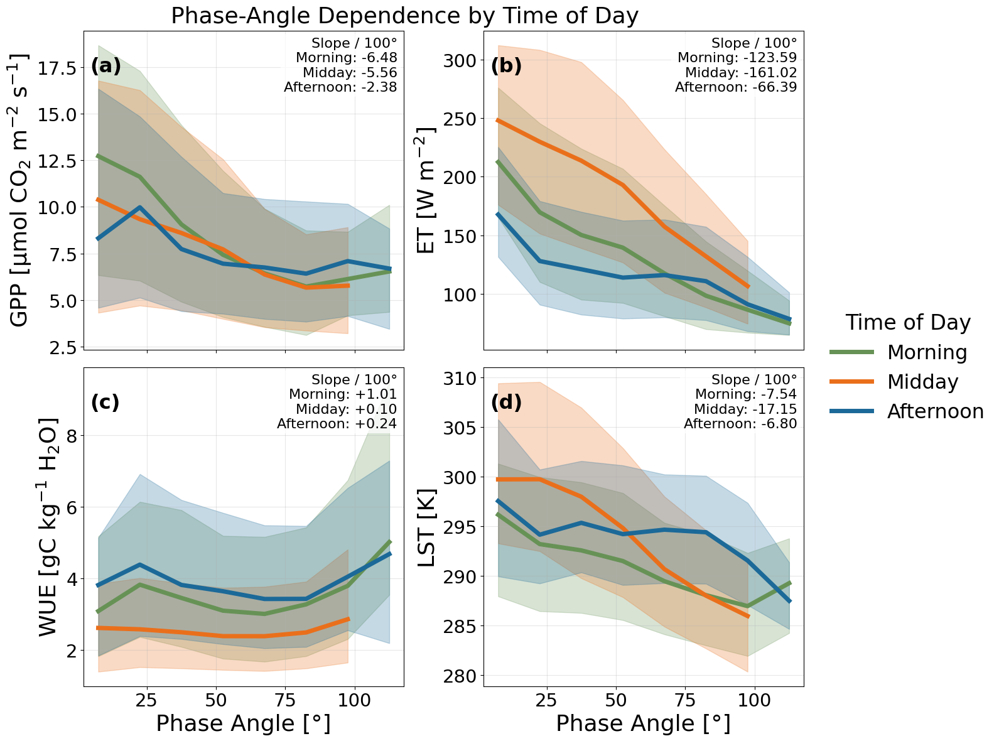

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# --------------------------
# SETTINGS
# --------------------------
VARS = {
    'GPP': {'ylabel': 'GPP [μmol CO$_2$ m$^{-2}$ s$^{-1}$]'},
    'ET':  {'ylabel': 'ET [W m$^{-2}$]'},
    'WUE': {'ylabel': 'WUE [gC kg$^{-1}$ H$_2$O]'},
    'LST': {'ylabel': 'LST [K]'}
}

TOD_COLORS = {
    'Morning': '#679256',
    'Midday': '#ea6f1b',
    'Afternoon': '#1b6998'
}

TOD_ORDER = ['Morning', 'Midday', 'Afternoon']

PHASE_BINS = np.arange(0, 155, 15)
PHASE_CENTERS = (PHASE_BINS[:-1] + PHASE_BINS[1:]) / 2

MIN_N = 30

df_wue = df_wue_hh_ecoco3.copy()

# --------------------------
# FILTER
# --------------------------
df = df_wue[
    df_wue['Phase_Angle'].notnull() &
    df_wue['TOD'].isin(TOD_ORDER)
].copy()

df['Phase_bin'] = pd.cut(
    df['Phase_Angle'],
    bins=PHASE_BINS,
    labels=PHASE_CENTERS
).astype(float)

# --------------------------
# AGGREGATE — MEDIAN + IQR
# --------------------------
agg = (
    df.groupby(['TOD', 'Phase_bin'])
      .agg(
          GPP_med=('GPP', 'median'),
          GPP_q25=('GPP', lambda x: x.quantile(0.25)),
          GPP_q75=('GPP', lambda x: x.quantile(0.75)),

          ET_med=('ET', 'median'),
          ET_q25=('ET', lambda x: x.quantile(0.25)),
          ET_q75=('ET', lambda x: x.quantile(0.75)),

          WUE_med=('WUE', 'median'),
          WUE_q25=('WUE', lambda x: x.quantile(0.25)),
          WUE_q75=('WUE', lambda x: x.quantile(0.75)),

          LST_med=('LST', 'median'),
          LST_q25=('LST', lambda x: x.quantile(0.25)),
          LST_q75=('LST', lambda x: x.quantile(0.75)),

          N=('WUE', 'size')
      )
      .reset_index()
)

agg = agg[agg['N'] >= MIN_N]

# --------------------------
# PLOT
# --------------------------
fig, axes = plt.subplots(2, 2, figsize=(13, 12), sharex=True)
axes = axes.flatten()   # <-- add this line
panel_labels = ['(a)', '(b)', '(c)', '(d)']

for i, (var, meta) in enumerate(VARS.items()):
    ax = axes[i]

    slope_lines = []
    for tod, color in TOD_COLORS.items():
        sub = agg[agg['TOD'] == tod]
        if sub.empty:
            continue

        x = sub['Phase_bin'].values
        y = sub[f'{var}_med'].values
        q25 = sub[f'{var}_q25'].values
        q75 = sub[f'{var}_q75'].values

        # Compute slope per 100°
        slope, _ = np.polyfit(x, y, 1)
        slope_per100 = slope * 100
        slope_lines.append(f"{tod}: {slope_per100:+.2f}")

        # Plot median + IQR. label=tod feeds the single shared legend built
        # below -- slopes differ per panel so they can't live in that legend
        # and are annotated on each panel instead.
        ax.plot(x, y, color=color, lw=5, label=tod)
        ax.fill_between(x, q25, q75, color=color, alpha=0.25)

    ax.text(
        0.98, 0.98, 'Slope / 100°\n' + '\n'.join(slope_lines),
        transform=ax.transAxes, fontsize=16, ha='right', va='top',
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.75)
    )

    # Panel formatting
    ax.set_ylabel(meta['ylabel'], fontsize=26)
    ax.tick_params(axis='both', labelsize=21)
    ax.text(0.02, 0.92, panel_labels[i], transform=ax.transAxes,
            fontsize=23, fontweight='bold', va='top', ha='left')
    ax.grid(alpha=0.3)

axes[-1].set_xlabel('Phase Angle [°]', fontsize=26)
axes[-2].set_xlabel('Phase Angle [°]', fontsize=26)

plt.suptitle('Phase-Angle Dependence by Time of Day', fontsize=26)
plt.tight_layout()

# Single legend for all four panels (Morning/Midday/Afternoon color coding is
# shared), placed outside the grid so it can't overlap any panel's data.
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.0, 0.5),
           frameon=False, fontsize=23, title='Time of Day', title_fontsize=24)

plt.savefig('figures/C2_validation/Figure6.png', dpi=300, bbox_inches='tight')
plt.show()

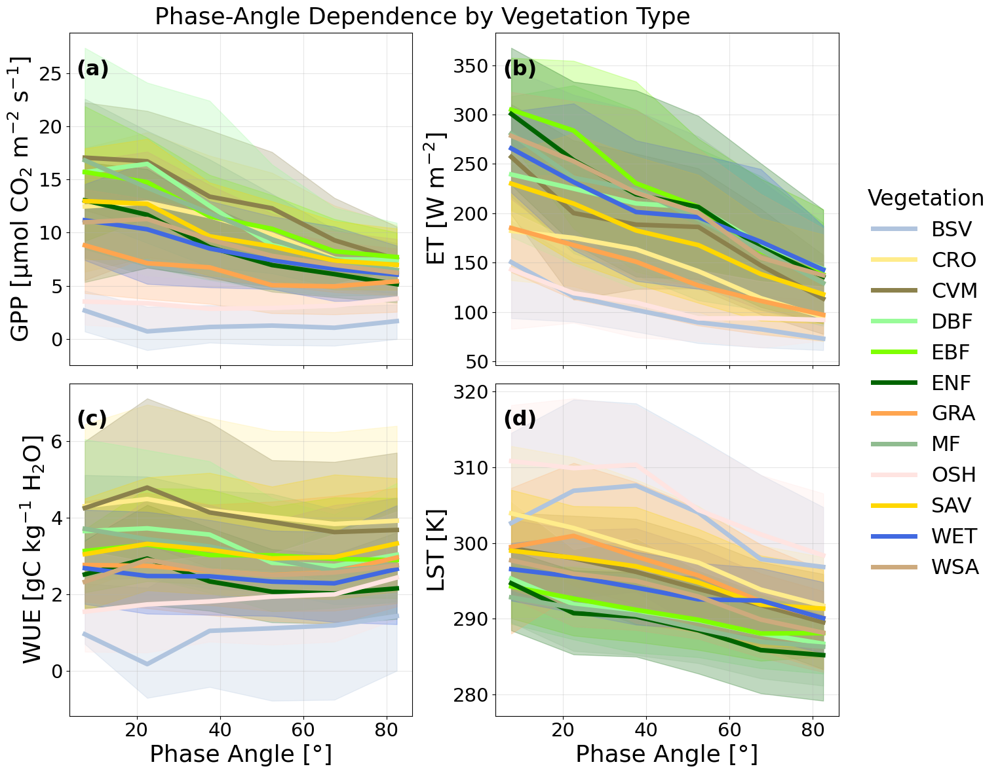

In [44]:
VARS = {
    'GPP': {'ylabel': 'GPP [μmol CO$_2$ m$^{-2}$ s$^{-1}$]'},
    'ET':  {'ylabel': 'ET [W m$^{-2}$]'},
    'WUE': {'ylabel': 'WUE [gC kg$^{-1}$ H$_2$O]'},
    'LST': {'ylabel': 'LST [K]'}
}

VEG_PALETTE = {
    'BSV': '#B0C4DE', 'CRO': '#FFEC8B', 'CSH': '#AB82FF', 'CVM': '#8B814C', 'DBF': '#98FB98',
    'DNF': '#9ACD32', 'EBF': '#7FFF00', 'ENF': '#006400', 'GRA': '#FFA54F', 'MF': '#8FBC8F',
    'OSH': '#FFE4E1', 'SAV': '#FFD700', 'SNO': '#000000', 'URB': '#FF0000', 'WAT': '#98F5FF',
    'WET': '#4169E1', 'WSA': '#CDAA7D',
}

PHASE_BINS = np.arange(0, 100, 15)
PHASE_CENTERS = (PHASE_BINS[:-1] + PHASE_BINS[1:]) / 2
MIN_N = 1

df = df_wue_hh_ecoco3[df_wue_hh_ecoco3['Phase_Angle'].notnull()].copy()
df = df[df['Veg'].isin(valid_veg) & df['kg_label'].isin(valid_kg)]
df['Phase_bin'] = pd.cut(df['Phase_Angle'], bins=PHASE_BINS, labels=PHASE_CENTERS).astype(float)

agg = (
    df.groupby(['Veg', 'Phase_bin'])
      .agg(
          GPP_med=('GPP', 'median'),
          GPP_q25=('GPP', lambda x: x.quantile(0.25)),
          GPP_q75=('GPP', lambda x: x.quantile(0.75)),
          ET_med=('ET', 'median'),
          ET_q25=('ET', lambda x: x.quantile(0.25)),
          ET_q75=('ET', lambda x: x.quantile(0.75)),
          WUE_med=('WUE', 'median'),
          WUE_q25=('WUE', lambda x: x.quantile(0.25)),
          WUE_q75=('WUE', lambda x: x.quantile(0.75)),
          LST_med=('LST', 'median'),
          LST_q25=('LST', lambda x: x.quantile(0.25)),
          LST_q75=('LST', lambda x: x.quantile(0.75)),
          N=('WUE', 'size')
      )
      .reset_index()
)
agg = agg[agg['N'] >= MIN_N]

fig, axes = plt.subplots(2, 2, figsize=(13, 12), sharex=True)
axes = axes.flatten()
panel_labels = ['(a)', '(b)', '(c)', '(d)']

for i, (var, meta) in enumerate(VARS.items()):
    ax = axes[i]
    for veg, color in VEG_PALETTE.items():
        sub = agg[agg['Veg'] == veg]
        if sub.empty:
            continue
        x = sub['Phase_bin'].values
        y = sub[f'{var}_med'].values
        q25 = sub[f'{var}_q25'].values
        q75 = sub[f'{var}_q75'].values
        ax.plot(x, y, color=color, lw=5, label=veg)
        ax.fill_between(x, q25, q75, color=color, alpha=0.25)
    ax.set_ylabel(meta['ylabel'], fontsize=26)
    ax.tick_params(axis='both', labelsize=21)
    ax.text(0.02, 0.92, panel_labels[i], transform=ax.transAxes,
            fontsize=23, fontweight='bold', va='top', ha='left')
    ax.grid(alpha=0.3)

axes[-1].set_xlabel('Phase Angle [°]', fontsize=26)
axes[-2].set_xlabel('Phase Angle [°]', fontsize=26)
plt.suptitle('Phase-Angle Dependence by Vegetation Type', fontsize=26)
plt.tight_layout()

# Single legend for all four panels, placed outside the grid (same set of
# vegetation types survives the N-filter in every panel, so panel (a)'s
# handles cover all of them) so it can't overlap any panel's data.
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.0, 0.5),
           frameon=False, fontsize=23, title='Vegetation', title_fontsize=24)

plt.savefig('figures/C2_validation/phase_angle_by_veg.png', dpi=300, bbox_inches='tight')
plt.show()